In [1]:


import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px


In [2]:
## load data set
data =pd.read_csv("datasetea.csv")
df= pd.DataFrame(data)
print(df)


                          time   latitude   longitude   depth   mag magType  \
0     2023-01-22T02:21:07.540Z  35.504500 -118.392667    3.86  1.02      ml   
1     2023-01-22T01:57:03.130Z  38.824833 -122.801666    2.55  1.89      md   
2     2023-01-22T01:56:26.625Z  64.627100 -150.159800   12.40  1.90      ml   
3     2023-01-22T01:53:47.160Z  19.259832 -155.420502   29.02  2.09      md   
4     2023-01-22T01:51:05.588Z  64.592500 -149.799600   18.00  1.50      ml   
...                        ...        ...         ...     ...   ...     ...   
9405  2022-12-23T02:44:45.937Z  63.282800 -150.606500  127.70  2.00      ml   
9406  2022-12-23T02:42:28.843Z  38.180500 -117.813900    7.90  1.40      ml   
9407  2022-12-23T02:41:04.040Z  38.829666 -122.791664    1.50  1.13      md   
9408  2022-12-23T02:30:14.282Z  63.368900 -153.228800    7.10  1.60      ml   
9409  2022-12-23T02:26:53.351Z  58.393000 -154.591000    6.30  2.00      ml   

       nst     gap      dmin     rms  ...          

In [3]:
df.head(10)

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2023-01-22T02:21:07.540Z,35.504500,-118.392667,3.86,1.02,ml,15.0,101.0,0.171300,0.15,...,2023-01-22T02:24:37.288Z,"13km SE of Bodfish, CA",earthquake,0.33,0.800,0.144,12.0,automatic,ci,ci
1,2023-01-22T01:57:03.130Z,38.824833,-122.801666,2.55,1.89,md,32.0,33.0,NaN,0.02,...,2023-01-22T02:14:11.186Z,"7km NW of The Geysers, CA",earthquake,0.17,0.330,0.180,34.0,automatic,nc,nc
2,2023-01-22T01:56:26.625Z,64.627100,-150.159800,12.40,1.90,ml,NaN,NaN,NaN,0.50,...,2023-01-22T01:58:03.893Z,"47 km SSE of Manley Hot Springs, Alaska",earthquake,NaN,0.500,NaN,NaN,automatic,ak,ak
3,2023-01-22T01:53:47.160Z,19.259832,-155.420502,29.02,2.09,md,31.0,117.0,NaN,0.19,...,2023-01-22T01:57:01.360Z,"8 km NE of Pāhala, Hawaii",earthquake,0.68,0.940,1.790,14.0,automatic,hv,hv
4,2023-01-22T01:51:05.588Z,64.592500,-149.799600,18.00,1.50,ml,NaN,NaN,NaN,0.13,...,2023-01-22T01:52:59.631Z,"32 km W of Four Mile Road, Alaska",earthquake,NaN,0.300,NaN,NaN,automatic,ak,ak
5,2023-01-22T01:39:22.975Z,61.718800,-147.698300,31.60,1.60,ml,NaN,NaN,NaN,1.09,...,2023-01-22T01:41:06.653Z,"10 km SSW of Glacier View, Alaska",earthquake,NaN,0.200,NaN,NaN,automatic,ak,ak
6,2023-01-22T01:34:08.410Z,38.780335,-122.763664,1.36,1.56,md,28.0,71.0,0.009736,0.04,...,2023-01-22T02:07:12.146Z,"1km WNW of The Geysers, CA",earthquake,0.23,0.340,0.150,28.0,automatic,nc,nc
7,2023-01-22T01:30:07.418Z,19.020400,-64.866100,35.00,3.10,ml,15.0,279.0,0.670000,0.43,...,2023-01-22T01:35:30.040Z,"75 km N of Charlotte Amalie, U.S. Virgin Islands",earthquake,7.68,2.026,0.067,29.0,reviewed,us,us
8,2023-01-22T01:21:10.430Z,34.645000,-119.050833,0.33,1.44,ml,23.0,53.0,0.098230,0.25,...,2023-01-22T01:24:43.155Z,"22km SSW of Frazier Park, CA",earthquake,0.33,0.650,0.174,28.0,automatic,ci,ci
9,2023-01-22T01:08:32.306Z,58.134400,-155.487900,21.30,0.80,ml,NaN,NaN,NaN,0.87,...,2023-01-22T01:11:11.187Z,Alaska Peninsula,earthquake,NaN,1.100,NaN,NaN,automatic,ak,ak


In [4]:
## know the structure of your data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9410 entries, 0 to 9409
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time             9410 non-null   object 
 1   latitude         9410 non-null   float64
 2   longitude        9410 non-null   float64
 3   depth            9410 non-null   float64
 4   mag              9409 non-null   float64
 5   magType          9409 non-null   object 
 6   nst              6823 non-null   float64
 7   gap              6822 non-null   float64
 8   dmin             5053 non-null   float64
 9   rms              9410 non-null   float64
 10  net              9410 non-null   object 
 11  id               9410 non-null   object 
 12  updated          9410 non-null   object 
 13  place            9410 non-null   object 
 14  type             9410 non-null   object 
 15  horizontalError  6347 non-null   float64
 16  depthError       9410 non-null   float64
 17  magError      

In [5]:
## checking data set for missing values 
df.isnull().sum()

time                  0
latitude              0
longitude             0
depth                 0
mag                   1
magType               1
nst                2587
gap                2588
dmin               4357
rms                   0
net                   0
id                    0
updated               0
place                 0
type                  0
horizontalError    3063
depthError            0
magError           2665
magNst             2600
status                0
locationSource        0
magSource             0
dtype: int64

In [6]:
df.describe()

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
count,9410.000000,9410.000000,9410.000000,9409.000000,6823.000000,6822.000000,5053.000000,9410.000000,6347.000000,9410.000000,6745.000000,6810.000000
mean,40.694347,-117.863831,25.593011,1.645013,23.403635,119.461838,0.747333,0.294069,1.698991,2.083547,0.276723,15.534655
std,20.430642,66.380624,54.697555,1.230108,22.145048,62.376305,2.697378,0.276421,3.095408,15.786392,0.477658,23.290696
min,-65.407100,-179.973800,-3.330000,-1.120000,0.000000,14.000000,0.000000,0.000000,0.070000,0.000000,0.000000,0.000000
25%,33.431417,-154.926417,2.972500,0.890000,9.000000,70.000000,0.014850,0.090000,0.260000,0.420000,0.110000,5.000000
50%,38.830166,-122.852837,9.125811,1.430000,17.000000,106.000000,0.063090,0.176600,0.440000,0.710000,0.169000,9.000000
75%,58.247167,-116.722042,25.296000,2.100000,31.000000,157.000000,0.196200,0.470000,0.860000,1.400000,0.248000,18.000000
max,82.000600,179.944100,635.507000,7.600000,289.000000,352.540000,56.433000,2.000000,23.780000,1350.300000,5.190000,768.000000


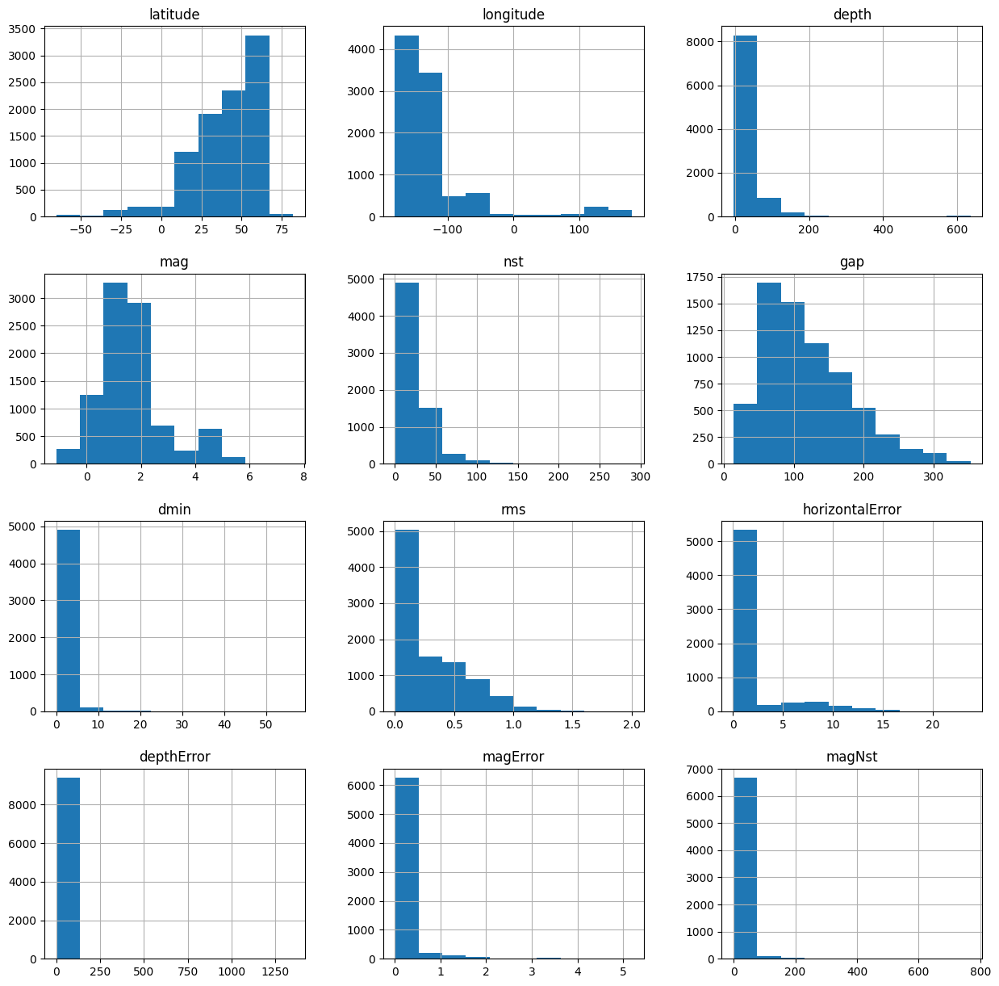

In [7]:
#plot an histogram
df.hist(bins= 10, figsize=(15,15))
plt.show()


In [8]:
df = pd.DataFrame(data, columns=["time","latitude","longitude","depth", "mag","magType", "nst", "gap", "dmin", "rms", "net", "id", "updated", "place", "type", "horizontalError", "depthError", "magError","magNst","status","locationSource","magSource"])
df.head

<bound method NDFrame.head of                           time   latitude   longitude   depth   mag magType  \
0     2023-01-22T02:21:07.540Z  35.504500 -118.392667    3.86  1.02      ml   
1     2023-01-22T01:57:03.130Z  38.824833 -122.801666    2.55  1.89      md   
2     2023-01-22T01:56:26.625Z  64.627100 -150.159800   12.40  1.90      ml   
3     2023-01-22T01:53:47.160Z  19.259832 -155.420502   29.02  2.09      md   
4     2023-01-22T01:51:05.588Z  64.592500 -149.799600   18.00  1.50      ml   
...                        ...        ...         ...     ...   ...     ...   
9405  2022-12-23T02:44:45.937Z  63.282800 -150.606500  127.70  2.00      ml   
9406  2022-12-23T02:42:28.843Z  38.180500 -117.813900    7.90  1.40      ml   
9407  2022-12-23T02:41:04.040Z  38.829666 -122.791664    1.50  1.13      md   
9408  2022-12-23T02:30:14.282Z  63.368900 -153.228800    7.10  1.60      ml   
9409  2022-12-23T02:26:53.351Z  58.393000 -154.591000    6.30  2.00      ml   

       nst     gap   

In [9]:
df= df.dropna ()
print(df)

                          time   latitude   longitude  depth   mag magType  \
0     2023-01-22T02:21:07.540Z  35.504500 -118.392667   3.86  1.02      ml   
6     2023-01-22T01:34:08.410Z  38.780335 -122.763664   1.36  1.56      md   
7     2023-01-22T01:30:07.418Z  19.020400  -64.866100  35.00  3.10      ml   
8     2023-01-22T01:21:10.430Z  34.645000 -119.050833   0.33  1.44      ml   
13    2023-01-22T00:28:43.250Z  38.828499 -122.852837   1.80  0.24      md   
...                        ...        ...         ...    ...   ...     ...   
9396  2022-12-23T03:25:22.350Z  36.204833 -120.784333   2.41  1.09      md   
9398  2022-12-23T03:19:28.570Z  38.780000 -122.760833   1.19  1.21      md   
9401  2022-12-23T03:02:00.880Z  47.101667 -121.719167  17.94  1.32      ml   
9402  2022-12-23T02:56:51.460Z  35.587667 -117.397333   8.48  0.98      ml   
9407  2022-12-23T02:41:04.040Z  38.829666 -122.791664   1.50  1.13      md   

       nst    gap      dmin   rms  ...                   update

In [10]:
df.isnull().sum()

time               0
latitude           0
longitude          0
depth              0
mag                0
magType            0
nst                0
gap                0
dmin               0
rms                0
net                0
id                 0
updated            0
place              0
type               0
horizontalError    0
depthError         0
magError           0
magNst             0
status             0
locationSource     0
magSource          0
dtype: int64

In [11]:
## new dataset after replacing missing values
df.head(15)

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2023-01-22T02:21:07.540Z,35.504500,-118.392667,3.86,1.02,ml,15.0,101.0,0.171300,0.15,...,2023-01-22T02:24:37.288Z,"13km SE of Bodfish, CA",earthquake,0.33,0.800,0.144000,12.0,automatic,ci,ci
6,2023-01-22T01:34:08.410Z,38.780335,-122.763664,1.36,1.56,md,28.0,71.0,0.009736,0.04,...,2023-01-22T02:07:12.146Z,"1km WNW of The Geysers, CA",earthquake,0.23,0.340,0.150000,28.0,automatic,nc,nc
7,2023-01-22T01:30:07.418Z,19.020400,-64.866100,35.00,3.10,ml,15.0,279.0,0.670000,0.43,...,2023-01-22T01:35:30.040Z,"75 km N of Charlotte Amalie, U.S. Virgin Islands",earthquake,7.68,2.026,0.067000,29.0,reviewed,us,us
8,2023-01-22T01:21:10.430Z,34.645000,-119.050833,0.33,1.44,ml,23.0,53.0,0.098230,0.25,...,2023-01-22T01:24:43.155Z,"22km SSW of Frazier Park, CA",earthquake,0.33,0.650,0.174000,28.0,automatic,ci,ci
13,2023-01-22T00:28:43.250Z,38.828499,-122.852837,1.80,0.24,md,8.0,98.0,0.003293,0.01,...,2023-01-22T00:46:11.652Z,"10km NW of The Geysers, CA",earthquake,0.38,0.960,0.120000,9.0,automatic,nc,nc
15,2023-01-22T00:14:35.660Z,34.166500,-118.432000,2.94,2.33,ml,62.0,39.0,0.060780,0.32,...,2023-01-22T02:16:56.889Z,"2km NE of Sherman Oaks, CA",earthquake,0.30,0.490,0.166000,24.0,automatic,ci,ci
17,2023-01-22T00:05:32.200Z,35.872500,-117.701833,10.53,1.34,ml,16.0,40.0,0.101900,0.19,...,2023-01-22T00:09:00.539Z,"20km ESE of Little Lake, CA",earthquake,0.33,0.790,0.246000,16.0,automatic,ci,ci
18,2023-01-21T23:58:55.070Z,39.745834,-124.042000,0.50,2.58,md,19.0,194.0,0.287500,0.20,...,2023-01-22T00:29:27.676Z,"18km W of Cape Vizcaino, CA",earthquake,0.84,7.570,0.080000,14.0,automatic,nc,nc
19,2023-01-21T23:52:23.980Z,17.867833,-67.009333,11.81,2.55,md,13.0,263.0,0.106400,0.15,...,2023-01-22T00:14:30.200Z,"12 km SSE of La Parguera, Puerto Rico",earthquake,0.68,0.480,0.128067,6.0,reviewed,pr,pr
21,2023-01-21T23:47:36.960Z,33.353000,-116.240333,7.41,1.18,ml,12.0,196.0,0.205900,0.30,...,2023-01-21T23:51:10.449Z,"16km NE of Borrego Springs, CA",earthquake,2.12,31.610,0.174000,20.0,automatic,ci,ci


In [12]:
df.describe()

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
count,4504.000000,4504.000000,4504.000000,4504.000000,4504.000000,4504.000000,4504.000000,4504.000000,4504.000000,4504.000000,4504.000000,4504.000000
mean,29.227780,-84.186296,24.502176,2.009152,26.268428,107.916963,0.818364,0.229447,2.148562,2.480334,0.155519,19.375000
std,18.992937,80.075084,70.699816,1.455190,23.665682,61.122945,2.847841,0.265380,3.551693,4.957939,0.088209,27.382218
min,-65.407100,-179.948000,-3.330000,-0.510000,3.000000,14.000000,0.000128,0.000000,0.070000,0.100000,0.000000,2.000000
25%,31.440622,-122.770165,2.440000,0.910000,12.000000,63.000000,0.013245,0.050000,0.250000,0.470000,0.096115,7.000000
50%,35.746917,-116.973667,7.694878,1.495000,20.000000,91.000000,0.058795,0.130000,0.430000,0.760000,0.142000,12.500000
75%,38.823334,-70.389200,13.702500,2.700000,32.000000,137.000000,0.196250,0.250000,1.332500,1.892000,0.198000,22.000000
max,82.000600,179.944100,635.507000,7.600000,289.000000,343.000000,56.433000,1.530000,23.780000,31.610000,0.839000,768.000000


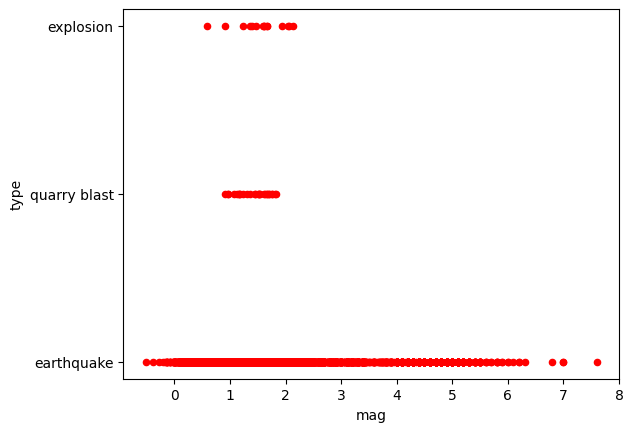

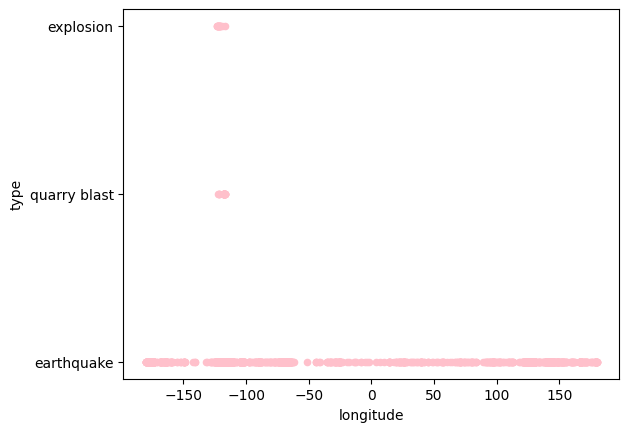

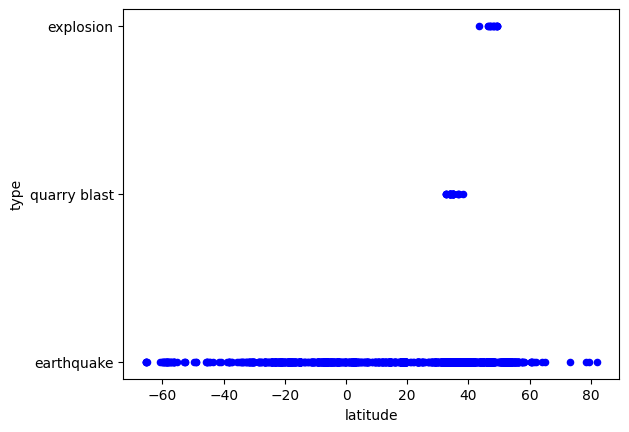

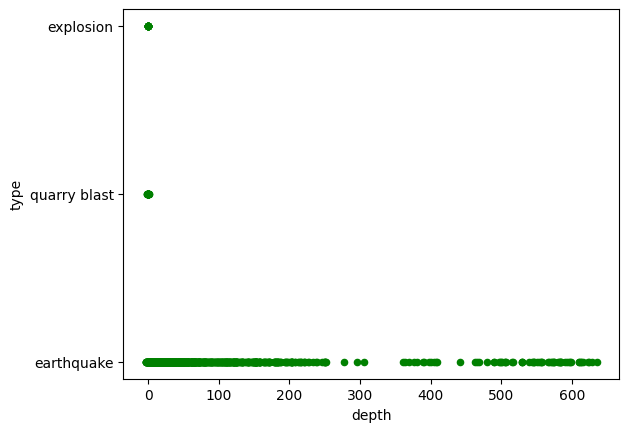

In [13]:
df.plot(kind='scatter', x= 'mag', y='type', color='red')
plt.xlabel('mag')
plt.ylabel('type')
plt.show()


df.plot(kind='scatter', x= 'longitude', y= 'type', color='pink')
plt.xlabel('longitude')
plt.ylabel('type')
plt.show()

df.plot(kind='scatter', x= 'latitude', y= 'type', color='blue')
plt.xlabel('latitude')
plt.ylabel('type')
plt.show()

df.plot(kind='scatter', x='depth', y= 'type', color = 'green')
plt.xlabel('depth')
plt.ylabel('type')

plt.show()


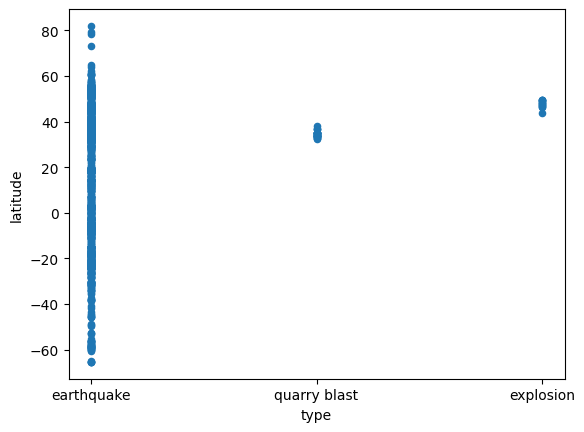

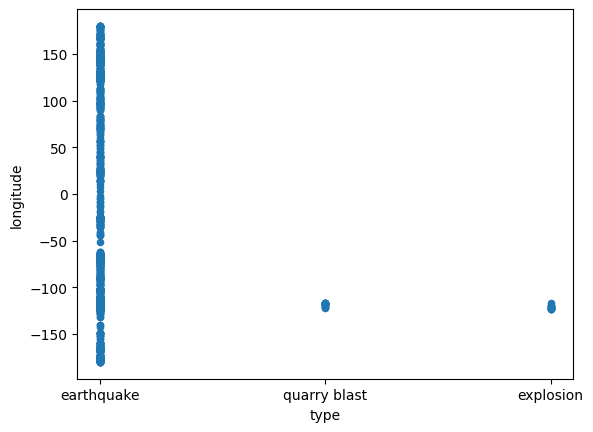

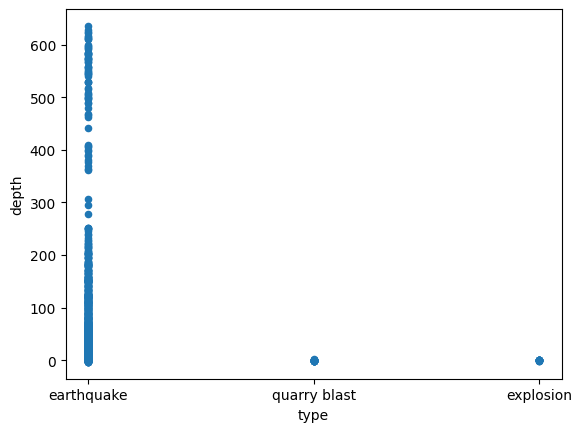

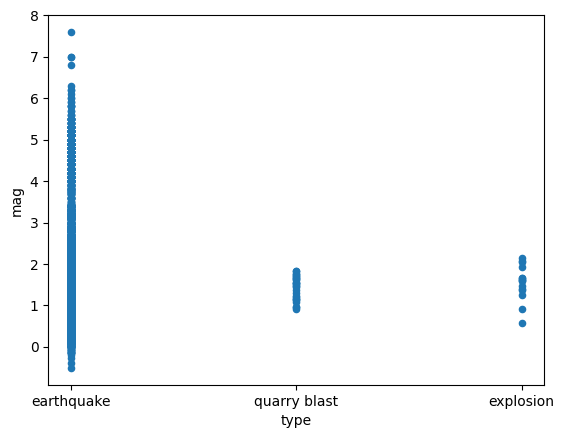

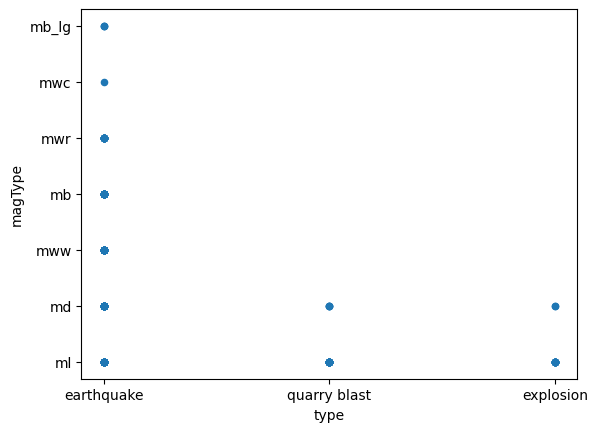

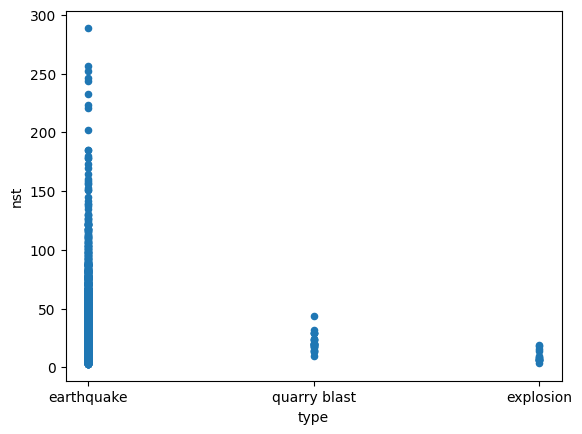

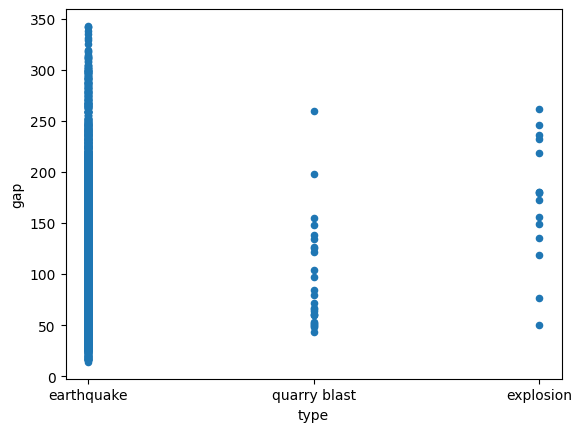

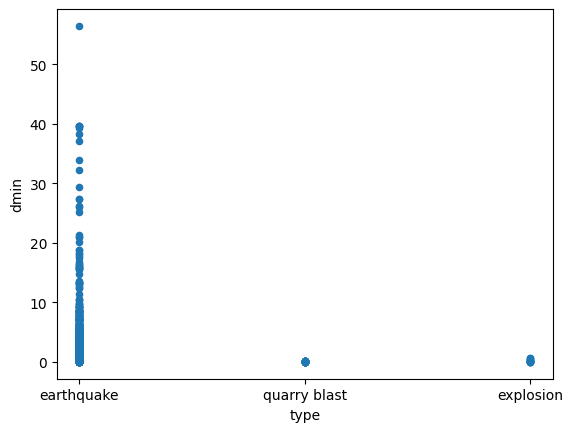

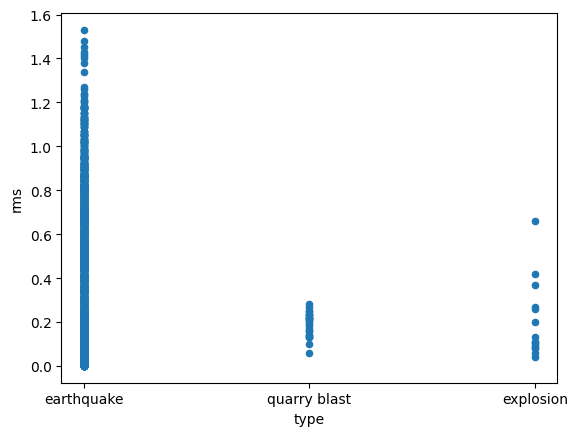

In [14]:
for i in range(1,10):
 df.plot(kind='scatter', x='type', y=df.columns[ i])
plt.show()

C:\Users\brill\AppData\Local\Temp\ipykernel_16232\3375856657.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  x= df.groupby('type').mean()['mag']


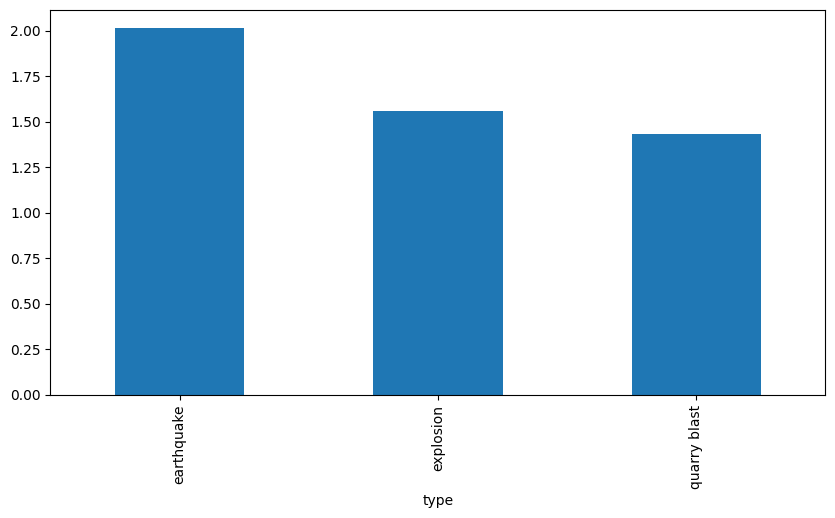

In [15]:
plt.figure(figsize=(10,5))
x= df.groupby('type').mean()['mag']
x.plot.bar()
plt.show()

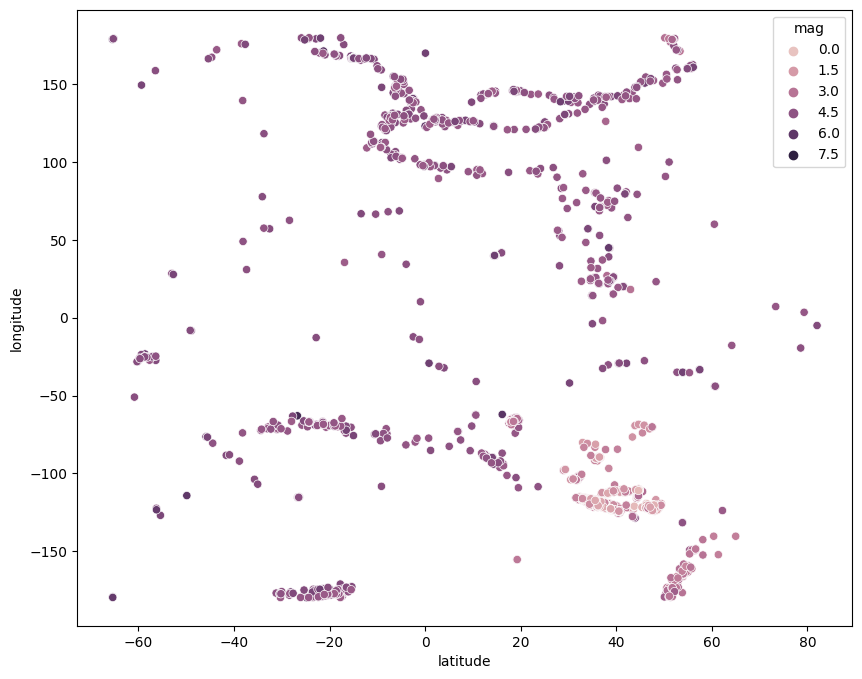

In [16]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=df,
               x= 'latitude',
               y= 'longitude',
               hue= 'mag')
plt.show()

<AxesSubplot: xlabel='latitude', ylabel='longitude'>

C:\Users\brill\AppData\Roaming\Python\Python310\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
C:\Users\brill\AppData\Roaming\Python\Python310\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


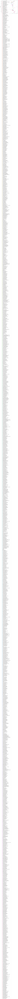

In [19]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=df,
               x= 'latitude',
               y= 'longitude',
               hue= 'place')

In [17]:
## plot correlation matrix
corr_mat = df.corr()
corr_mat

C:\Users\brill\AppData\Local\Temp\ipykernel_16232\807756656.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_mat = df.corr()


,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
latitude,1.000000,-0.449875,-0.418786,-0.644184,-0.179608,-0.047014,-0.492643,-0.540188,-0.608869,-0.175089,0.186058,-0.114932
longitude,-0.449875,1.000000,0.238528,0.682438,0.312510,0.058992,0.342198,0.609197,0.631688,0.200808,-0.204522,0.234112
depth,-0.418786,0.238528,1.000000,0.432576,0.240805,-0.025856,0.179152,0.418520,0.541927,0.265252,-0.138032,0.223830
mag,-0.644184,0.682438,0.432576,1.000000,0.496775,0.111681,0.486438,0.830586,0.804818,0.307680,-0.318251,0.389903
nst,-0.179608,0.312510,0.240805,0.496775,1.000000,-0.358214,0.222182,0.447289,0.324401,0.027169,-0.262044,0.579036
gap,-0.047014,0.058992,-0.025856,0.111681,-0.358214,1.000000,-0.007144,0.045311,0.110328,0.232796,-0.101233,-0.195023
dmin,-0.492643,0.342198,0.179152,0.486438,0.222182,-0.007144,1.000000,0.423295,0.594882,0.101200,-0.125590,0.191685
rms,-0.540188,0.609197,0.418520,0.830586,0.447289,0.045311,0.423295,1.000000,0.780317,0.323542,-0.267460,0.350262
horizontalError,-0.608869,0.631688,0.541927,0.804818,0.324401,0.110328,0.594882,0.780317,1.000000,0.334882,-0.205857,0.282775
depthError,-0.175089,0.200808,0.265252,0.307680,0.027169,0.232796,0.101200,0.323542,0.334882,1.000000,-0.090496,0.066031


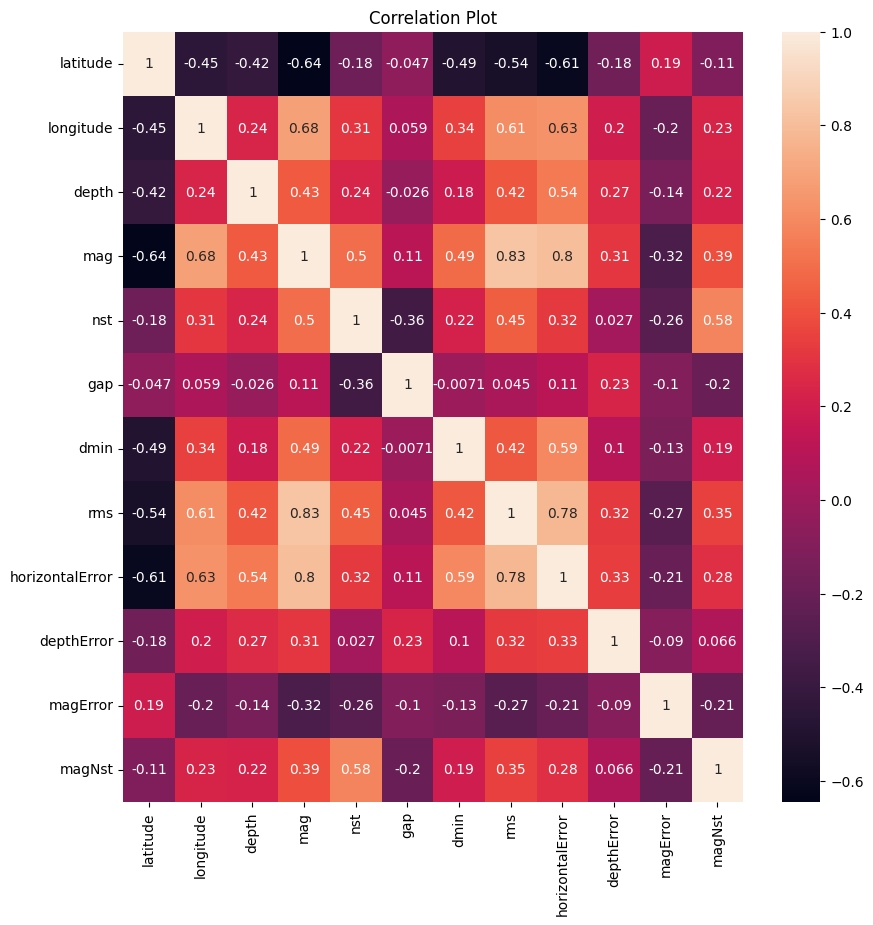

In [18]:
plt.figure(figsize=(10,10))
sns.heatmap(corr_mat, annot=True)
plt.title('Correlation Plot')
plt.show()

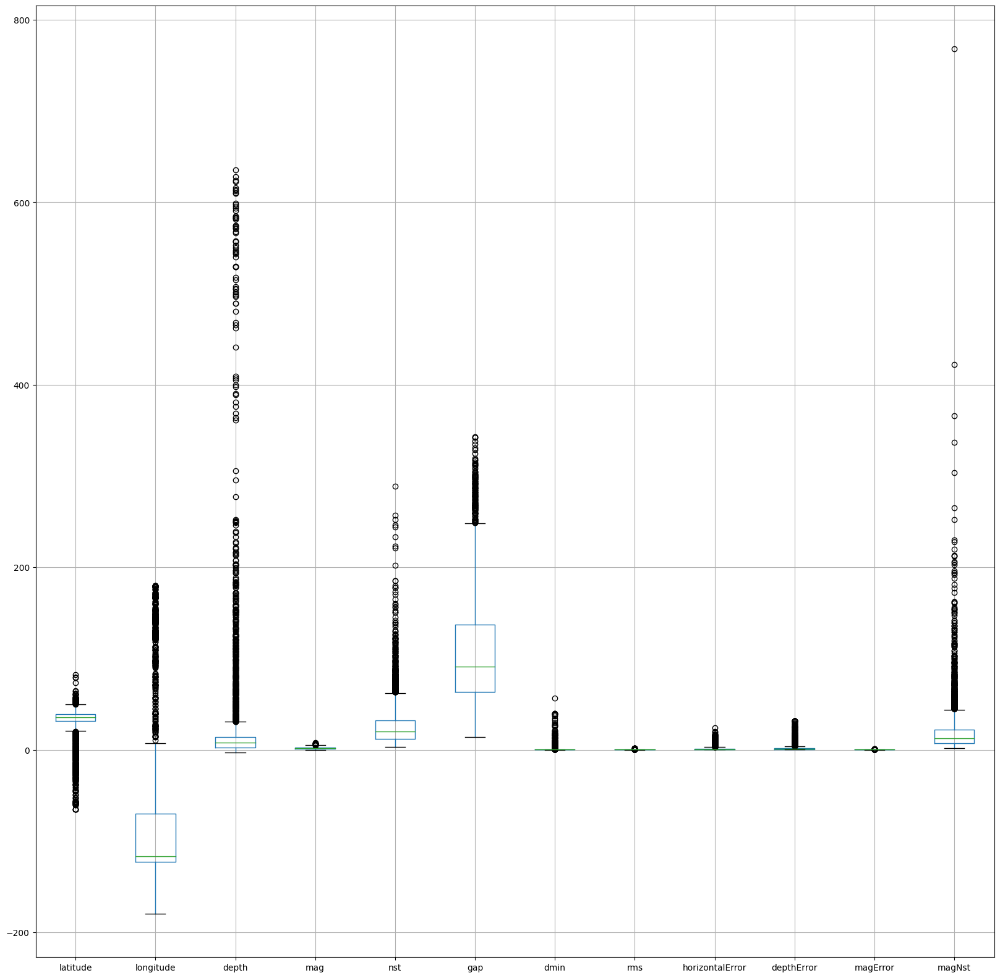

In [17]:
df.boxplot(figsize=(20,20))
plt.show()

In [18]:
## removing outliers in latitude column
max_threshold, min_threshold = df['latitude'].quantile([0.75,0.25])
df_new = df[(df.latitude>min_threshold) & (df.latitude<max_threshold)]


In [19]:

max_threshold, min_threshold = df['magNst'].quantile([0.75,0.25])
df_new = df[(df.magNst>min_threshold) & (df.magNst<max_threshold)]

In [20]:

max_threshold, min_threshold = df['magError'].quantile([0.75,0.25])
df_new = df[(df.magError>min_threshold) & (df.magError<max_threshold)]

In [21]:

max_threshold, min_threshold = df['depthError'].quantile([0.75,0.25])
df_new = df[(df.depthError>min_threshold) & (df.depthError<max_threshold)]

In [22]:

max_threshold, min_threshold = df['horizontalError'].quantile([0.75,0.25])
df_new = df[(df.horizontalError>min_threshold) & (df.horizontalError<max_threshold)]

In [23]:

max_threshold, min_threshold = df['dmin'].quantile([0.75,0.25])
df_new = df[(df.dmin>min_threshold) & (df.dmin<max_threshold)]

In [24]:

max_threshold, min_threshold = df['rms'].quantile([0.75,0.25])
df_new = df[(df.rms>min_threshold) & (df.rms<max_threshold)]

In [25]:

max_threshold, min_threshold = df['longitude'].quantile([0.75,0.25])
df_new = df[(df.longitude>min_threshold) & (df.longitude<max_threshold)]

In [26]:

max_threshold, min_threshold = df['depth'].quantile([0.75,0.25])
df_new = df[(df.depth>min_threshold) & (df.depth<max_threshold)]

In [27]:

max_threshold, min_threshold = df['mag'].quantile([0.75,0.25])
df_new = df[(df.mag>min_threshold) & (df.mag<max_threshold)]

In [28]:

max_threshold, min_threshold = df['nst'].quantile([0.75,0.25])
df_new = df[(df.nst>min_threshold) & (df.nst<max_threshold)]

In [29]:

max_threshold, min_threshold = df['gap'].quantile([0.75,0.25])
df_new = df[(df.gap>min_threshold) & (df.gap<max_threshold)]

In [30]:
df_new

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2023-01-22T02:21:07.540Z,35.504500,-118.392667,3.86,1.02,ml,15.0,101.0,0.171300,0.15,...,2023-01-22T02:24:37.288Z,"13km SE of Bodfish, CA",earthquake,0.33,0.80,0.144000,12.0,automatic,ci,ci
6,2023-01-22T01:34:08.410Z,38.780335,-122.763664,1.36,1.56,md,28.0,71.0,0.009736,0.04,...,2023-01-22T02:07:12.146Z,"1km WNW of The Geysers, CA",earthquake,0.23,0.34,0.150000,28.0,automatic,nc,nc
13,2023-01-22T00:28:43.250Z,38.828499,-122.852837,1.80,0.24,md,8.0,98.0,0.003293,0.01,...,2023-01-22T00:46:11.652Z,"10km NW of The Geysers, CA",earthquake,0.38,0.96,0.120000,9.0,automatic,nc,nc
25,2023-01-21T22:58:24.400Z,38.837334,-122.836998,1.25,0.77,md,20.0,80.0,0.001722,0.02,...,2023-01-21T23:23:14.344Z,"10km NW of The Geysers, CA",earthquake,0.19,0.41,0.170000,20.0,automatic,nc,nc
27,2023-01-21T22:55:49.590Z,38.818165,-122.821831,2.71,0.98,md,9.0,119.0,0.010560,0.02,...,2023-01-21T23:12:12.109Z,"7km NW of The Geysers, CA",earthquake,0.40,0.83,0.220000,12.0,automatic,nc,nc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9385,2022-12-23T03:55:13.140Z,46.783667,-120.660167,8.66,1.58,ml,26.0,76.0,0.124000,0.21,...,2022-12-23T05:45:58.040Z,"6 km NNE of Naches, Washington",earthquake,0.27,0.40,0.150200,20.0,reviewed,uw,uw
9391,2022-12-23T03:36:16.310Z,35.660167,-117.442833,5.67,1.63,ml,19.0,125.0,0.075180,0.21,...,2022-12-23T18:07:57.840Z,"12km SSW of Searles Valley, CA",earthquake,0.47,1.51,0.123000,22.0,reviewed,ci,ci
9395,2022-12-23T03:25:30.450Z,38.816834,-122.794998,2.37,0.70,md,9.0,91.0,0.008856,0.01,...,2022-12-23T04:19:15.023Z,"6km NW of The Geysers, CA",earthquake,0.59,0.64,0.290000,11.0,automatic,nc,nc
9398,2022-12-23T03:19:28.570Z,38.780000,-122.760833,1.19,1.21,md,35.0,81.0,0.010030,0.10,...,2022-12-30T22:55:10.017Z,"0km NW of The Geysers, CA",earthquake,0.29,0.35,0.087000,6.0,reviewed,nc,nc
